# Question 1 Part 1
<ul>
    <li>Each pixel for every colour takes 8 bits = 1 Byte</li>
    <li>Now since it is a colour image hence each pixel will take 3 Bytes</li>
    <li>Given that the ratio of height to width is 4:3 we can assume that there are 4x pixels in height and 3x pixels in the width</li>
    <li>Now given that each pixel is 3 Bytes and there are $(4x * 3x)$ pixels </li>
    <li>Now we equare them given that the file size is 5.76 MB = 5760000 Bytes </li>
    <li> Equating we get the equation $ 3*(4x * 3x) = 5760000 $ </li>
    <li> $ 36*x^{2} = 5760000 \\ x^{2} = 160000 \\ x = 400 $ </li>
    <li> Since width = 3x pixels and height = 4x pixels </li>
    <li> The dimension of the image is 1600*900 pixels </li>
</ul>

# Question 1 Part 2
<ul>
    <li>Let the Bytes required for one pixel in each case be p</li>
    <li>Now given that it is a square image of 5200*5200 pixels and he takes 2000 images</li>
    <li>The total memory required will be 5200*5200*p*2000</li>
    <li>Given he has 64 GB memory cards assuming he requires x memory cards</li>
    <li>The generalised equation will be $64 * 10^{9} * x = 5408 * 10^{7} * p$ </li>
    <li> $ x = \frac{5408 * 10^{7} * p}{64 * 10^{9}} \\ x = 0.845*p $ </li>
</ul>

### Part (a)

<ul>
    <li>In this the image is a black and white image and hence requires only 1 bit per pixel</li>
    <li>Hence in this case $p = \frac{1}{8}$</li>
    <li>Substituting this we get $x = \frac{0.845}{8} = 0.106$</li>
    <li>Rounding up the value we get that only 1 Memory card will be required</li>
</ul>

### Part (b)

<ul>
    <li>In this the image is a grayscale image and hence requires 1 Byte per pixel</li>
    <li>Hence in this case $p = 1$</li>
    <li>Substituting this we get $x = 0.845*1 = 0.845$</li>
    <li>Rounding up the value we get that only 1 Memory card will be required</li>
</ul>

### Part (c)

<ul>
    <li>In this the image is a colour image and hence requires only 3 Bytes per pixel(1 for red,green and blue</li>
    <li>Hence in this case $p = 3$</li>
    <li>Substituting this we get $x = 0.845*3 = 2.535$</li>
    <li>Rounding up the value we need 3 Memory cards</li>
</ul>

# Question 1 Part 3

The reason for the pixels to be individually distinguishable on the bill board is that the number of pixels in a unit area is lesser as compared to that on a desktop screen. The reason for that is the for the image the number of pixels in width and height remain same for desktop and bill board but the number of pixels per inch (ppi) is greater in case of desktop due to its small screen size. PPI is a concept of resolution. This was the reason why the image was less when displayed on bill board

# Question 2

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

### Question 2 Part (1)

In [2]:
# Returns 0 for red, 1 for green and 2 for blue
def mostfrequent(image):
    height = image.shape[0]
    width = image.shape[1]
    count = height*width
    r_avg = np.mean(image[:,:,0])
    g_avg = np.mean(image[:,:,1])
    b_avg = np.mean(image[:,:,2])
    if(max(r_avg,g_avg,b_avg) == r_avg):
        return 0
    if(max(r_avg,g_avg,b_avg) == g_avg):
        return 1
    if(max(r_avg,g_avg,b_avg) == b_avg):
        return 2

### Question 2 Part (2)

In [3]:
foreground = cv2.imread('Images/foreground.png')
background = cv2.imread('Images/background.png')
foreground = cv2.cvtColor(foreground, cv2.COLOR_BGR2RGB)
background = cv2.cvtColor(background, cv2.COLOR_BGR2RGB)

In [8]:
# Image is foreground and Image1 is background
def mergeImage(image,image1):
    height = image.shape[0]
    width = image.shape[1]
    mostfreq = mostfrequent(image)
    final = np.zeros((height,width,3),dtype = int)
    for i in range(height):
        for j in range(width):
            # If red is the most frequent
            if mostfreq == 0:
                if(max(image[i][j]) == image[i][j][0] and image[i][j][0]-image[i][j][1] > 50 and image[i][j][0]-image[i][j][2] > 50):
                    final[i][j] = image1[i][j]
                else:
                    final[i][j] = image[i][j]
            # If green is the most frequent
            if mostfreq == 1:
                if(max(image[i][j]) == image[i][j][1] and image[i][j][1]-image[i][j][0] > 50 and image[i][j][1]-image[i][j][2] > 50):
                    final[i][j] = image1[i][j]
                else:
                    final[i][j] = image[i][j]
            # If blue is the most frequent
            if mostfreq == 2:
                if(max(image[i][j]) == image[i][j][2] and image[i][j][2]-image[i][j][0] > 50 and image[i][j][2]-image[i][j][1] > 50):
                    final[i][j] = image1[i][j]
                else:
                    final[i][j] = image[i][j]
    return final

In [9]:
merge_img = mergeImage(foreground,background)

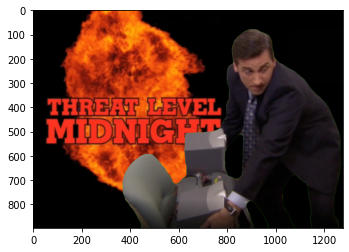

In [10]:
plt.imshow(merge_img)

# Question 3

In [21]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

### Question 3 Part (1)

In [17]:
def piecewiseLinTransform(K1,K2,A,B,image):
    image = image/255;
    height = image.shape[0]
    width = image.shape[1]
    # Here we assume that A and B are sorted
    for i in range(height):
        for j in range(width):
            for k in range(A.size):
                if(image[i][j] >= A[k] and image[i][j] <= B[k]):
                    image[i][j] = K1[k]*image[i][j] + K2[k]
                    break
    image = image * 255
    return image

### Question 3 Part (2)

In [18]:
pam1 = cv2.imread('Images/pam1.png',0)
pam2 = cv2.imread('Images/pam2.png',0)

In [19]:
A1 = np.array([0.0,0.2,0.4])
B1 = np.array([0.2,0.4,1])

In [20]:
K11 = np.array([2,-1,1])
K21 = np.array([0.1,0.7,-0.1])

In [21]:
A2 = np.array([0.0,0.2,0.4,0.6,0.8])
B2 = np.array([0.2,0.4,0.6,0.8,1])

In [22]:
K12 = np.array([0,0,0,0,0])
K22 = np.array([0,0.2,0.4,0.6,0.8])

In [23]:
pam1_tranform = piecewiseLinTransform(K11,K21,A1,B1,pam1)
pam2_tranform = piecewiseLinTransform(K12,K22,A2,B2,pam2)

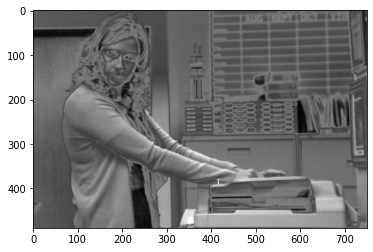

In [24]:
plt.imshow(pam1_tranform,cmap = 'gray')

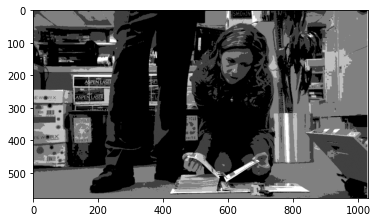

In [25]:
plt.imshow(pam2_tranform,cmap = 'gray')

### Question 3 Part (3)

In [40]:
K13 = np.array([0.0,1.0,0.0])
K23 = np.array([0.2,0.0,0.8])

In [41]:
A3 = np.array([0,0.2,0.8])
B3 = np.array([0.2,0.8,1.0])

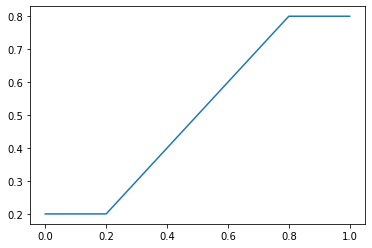

In [42]:
x = [0.0,0.2,0.8,1.0]
y = [0.2,0.2,0.8,0.8]
plt.plot(x,y)

In [43]:
pam3 = cv2.imread('Images/pam3.jpg',0)

In [44]:
pam3_transform = piecewiseLinTransform(K13,K23,A3,B3,pam3)

(-0.5, 1099.5, 733.5, -0.5)

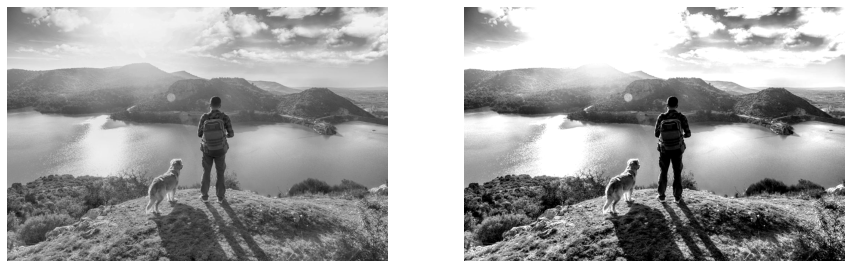

In [49]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(5)

plt.subplot(121)
plt.imshow(pam3,cmap = 'gray')
plt.axis('off')
plt.subplot(122)
plt.imshow(pam3_transform,cmap = 'gray')
plt.axis('off')

The steps for the following is :
1) Plot the graph on a paper \
2) Then from that graph we get the value of K1 and K2 from the line equation of the piecewiseTransform \
3) A and B can be found on the axis where the equation of the piece wise line changes \

# Question 4

In [53]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

### Question 4 Part (1)

In [54]:
def bitSlice(image,k):
    k = 8 - k
    ans = np.zeros([image.shape[0],image.shape[1]],dtype = int)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            temp = np.binary_repr(image[i][j],width = 8)
            ans[i][j] = temp[k]
    ans = ans*np.power(2,7-k)
    return ans

### Question 4 Part (2)

In [55]:
rupee = cv2.imread('Images/rupee.jpg',0)
security = cv2.imread('Images/securityThreat.jpg',0)
pepper = cv2.imread('Images/pepper.jpg',0)

(-0.5, 747.5, 293.5, -0.5)

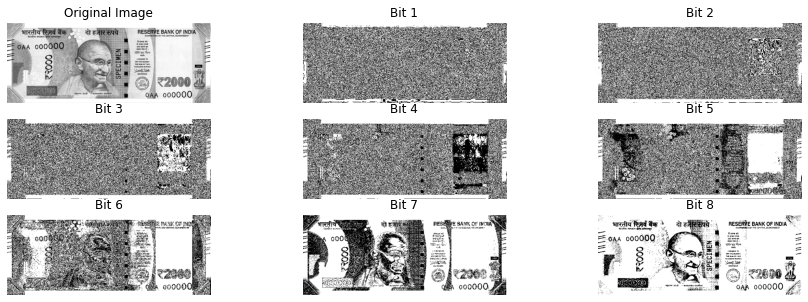

In [56]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(5)

for i in range(8):
    img = bitSlice(rupee,i+1)
    plt.subplot(3,3,i+2)
    plt.imshow(img,cmap = 'gray')
    plt.title("Bit " + str(i+1))
    plt.axis('off')
plt.subplot(3,3,1)
plt.imshow(rupee,cmap = 'gray')
plt.title("Original Image")
plt.axis('off')

(-0.5, 545.5, 340.5, -0.5)

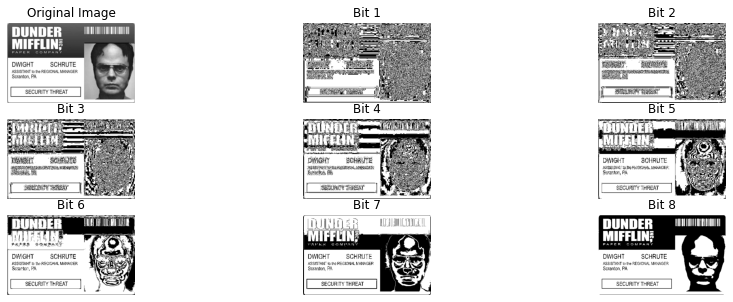

In [59]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(5)

for i in range(8):
    img = bitSlice(security,i+1)
    plt.subplot(3,3,i+2)
    plt.imshow(img,cmap = 'gray')
    plt.title("Bit " + str(i+1))
    plt.axis('off')
plt.subplot(3,3,1)
plt.imshow(security,cmap = 'gray')
plt.title("Original Image")
plt.axis('off')

(-0.5, 1199.5, 799.5, -0.5)

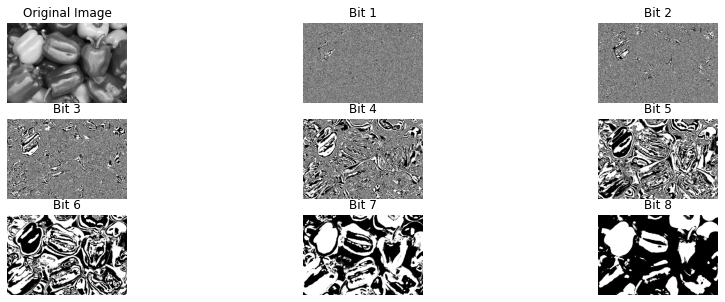

In [60]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(5)

for i in range(8):
    img = bitSlice(pepper,i+1)
    plt.subplot(3,3,i+2)
    plt.imshow(img,cmap = 'gray')
    plt.title("Bit " + str(i+1))
    plt.axis('off')
plt.subplot(3,3,1)
plt.imshow(pepper,cmap = 'gray')
plt.title("Original Image")
plt.axis('off')

### Question 4 Part (3)

In [61]:
def imgBitQuantizer(image,k):
    ans = np.zeros([image.shape[0],image.shape[1]],dtype = int)
    for i in range(k):
        temp = bitSlice(image,8 - i)
        ans = np.add(ans,temp)
    return ans

### Question 4 Part (4)

(-0.5, 747.5, 293.5, -0.5)

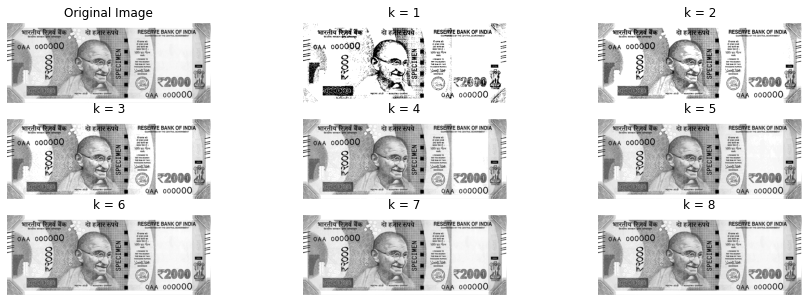

In [63]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(5)

for i in range(8):
    img = imgBitQuantizer(rupee,i+1)
    plt.subplot(3,3,i+2)
    plt.imshow(img,cmap = 'gray')
    plt.title("k = " + str(i+1))
    plt.axis('off')
plt.subplot(3,3,1)
plt.imshow(rupee,cmap = 'gray')
plt.title("Original Image")
plt.axis('off')

(-0.5, 545.5, 340.5, -0.5)

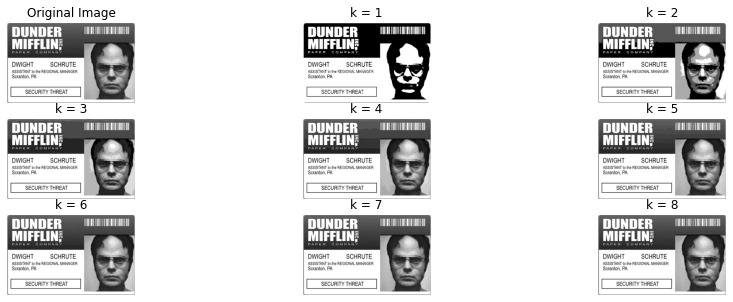

In [65]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(5)

for i in range(8):
    img = imgBitQuantizer(security,i+1)
    plt.subplot(3,3,i+2)
    plt.imshow(img,cmap = 'gray')
    plt.title("k = " + str(i+1))
    plt.axis('off')
plt.subplot(3,3,1)
plt.imshow(security,cmap = 'gray')
plt.title("Original Image")
plt.axis('off')

(-0.5, 1199.5, 799.5, -0.5)

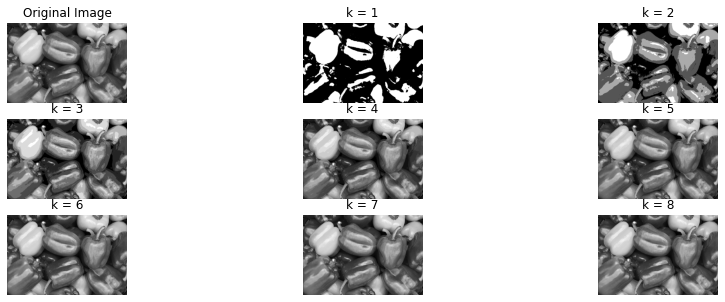

In [64]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(5)

for i in range(8):
    img = imgBitQuantizer(pepper,i+1)
    plt.subplot(3,3,i+2)
    plt.imshow(img,cmap = 'gray')
    plt.title("k = " + str(i+1))
    plt.axis('off')
plt.subplot(3,3,1)
plt.imshow(pepper,cmap = 'gray')
plt.title("Original Image")
plt.axis('off')

### Question 4 Part (5)

From the above parts in 4.2 and 4.4 we can observe that most of the information of the image is retained in the Most significant bits of the image (Bit plane 8 then 7 and so on). And from the Part 4 plots we can see that with quantizing it to 4 bits does not signficantly affect the quality of the image. Hence one of the application is to compress the image

# Question 5

### Question 5 Part (1)

<ol>
    <li> The acceptable for gamma is from $ [0, \infty]$ </li>
    <li> If the values of gamma is from $ [0, \infty]$ then for c = 1 the range will always be in 0 to 255 but if gamma is less than 0 then the value will not be in 0 to 255 in that case $ c = \frac{1}{max(r)^{\gamma}}$ </li>
</ol>

In [70]:
x = np.linspace(0,1,num = 1000)

In [72]:
gamma1 = np.power(x,0.25)
gamma2 = np.power(x,1)
gamma3 = np.power(x,4)

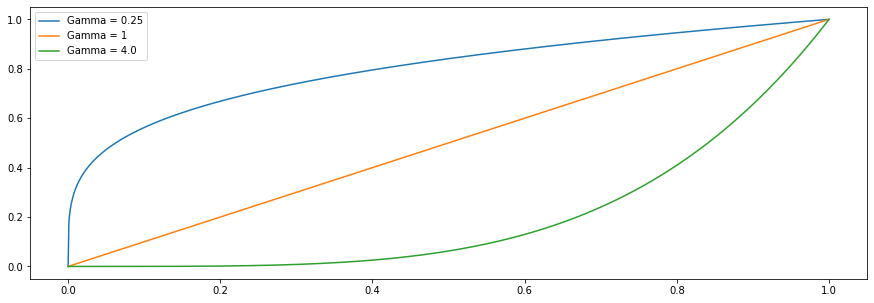

In [73]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(5)

plt.plot(x,gamma1)
plt.plot(x,gamma2)
plt.plot(x,gamma3)

plt.legend(["Gamma = 0.25","Gamma = 1","Gamma = 4.0"])

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

### Question 5 Part (2)

In [71]:
def powerLawTransform(im,gamma):
    c = 1
    im = im/255 #Normalization
    ans = np.zeros([im.shape[0],im.shape[1]],dtype = float)
    res = np.zeros([im.shape[0],im.shape[1]],dtype = int)
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            ans[i][j] = c * ((im[i][j])**gamma)
    ans = ans*255
    res = ans
    return res

### Question 5 Part (3)

In [72]:
scraton = cv2.imread('Images/scrantonAreal.png',0)
tripgrp = cv2.imread('Images/tripGrpPhoto.png',0)

In [73]:
scraton_gamma1 = powerLawTransform(scraton,0.25)
scraton_gamma2 = powerLawTransform(scraton,1)
scraton_gamma3 = powerLawTransform(scraton,4)

Text(0.5, 1.0, 'Gamma = 4')

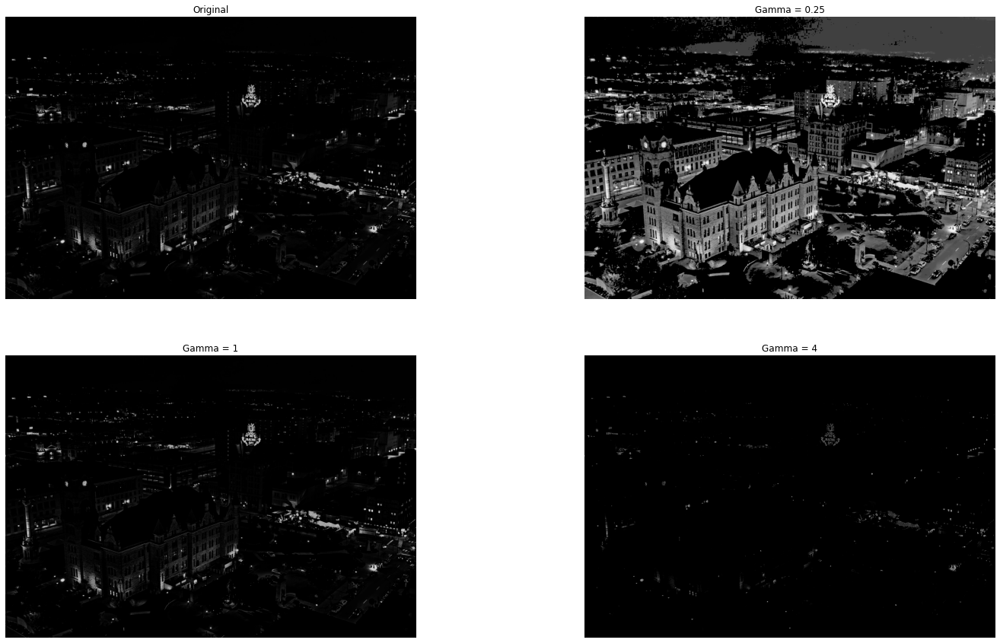

In [74]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(2,2,1)
plt.imshow(scraton,cmap = 'gray')
plt.axis('off')
plt.title('Original')
plt.subplot(2,2,2)
plt.imshow(scraton_gamma1,cmap = 'gray')
plt.axis('off')
plt.title('Gamma = 0.25')
plt.subplot(2,2,3)
plt.imshow(scraton_gamma2,cmap = 'gray')
plt.axis('off')
plt.title('Gamma = 1')
plt.subplot(2,2,4)
plt.imshow(scraton_gamma3,cmap = 'gray')
plt.axis('off')
plt.title('Gamma = 4')

In [96]:
tripgrp_gamma1 = powerLawTransform(tripgrp,0.25)
tripgrp_gamma2 = powerLawTransform(tripgrp,1)
tripgrp_gamma3 = powerLawTransform(tripgrp,4)

Text(0.5, 1.0, 'Gamma = 4')

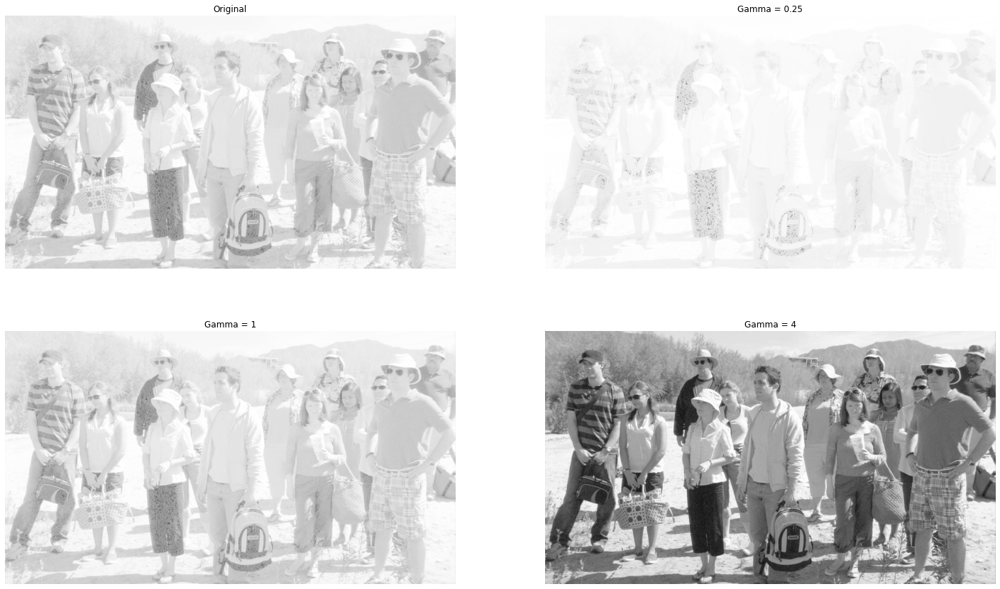

In [97]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(2,2,1)
plt.imshow(tripgrp,cmap = 'gray')
plt.axis('off')
plt.title('Original')
plt.subplot(2,2,2)
plt.imshow(tripgrp_gamma1,cmap = 'gray')
plt.axis('off')
plt.title('Gamma = 0.25')
plt.subplot(2,2,3)
plt.imshow(tripgrp_gamma2,cmap = 'gray')
plt.axis('off')
plt.title('Gamma = 1')
plt.subplot(2,2,4)
plt.imshow(tripgrp_gamma3,cmap = 'gray')
plt.axis('off')
plt.title('Gamma = 4')

The above thus empirically prove that with gamma > 1 a image generally darkens and with gamma < 1 the image colour are increased

### Question 5 Part (4)

The magical Transformation is Log transform

The transform is mathematically defined as $ s = c.log(1+r)$ \
Here c is a constant which is equal to $ c = \frac{255}{log(1+maximum pixel value)}$

In [105]:
x = np.linspace(0,255,num = 256)

In [109]:
c = 255/np.log(256)
y = c * np.log(1+x)

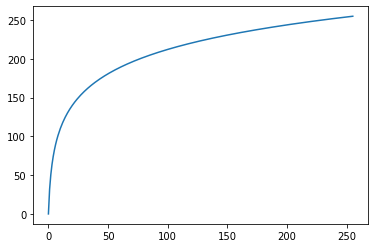

In [110]:
plt.plot(x,y)

In [115]:
def logtransform(img):
    c = 255.0/np.log(1+np.max(img))
    log_img = np.zeros([img.shape[0],img.shape[1]],dtype = int)
    for i in range(img.shape[0]):
            for j in range(img.shape[1]):
                log_img[i][j] = c * np.log(1+img[i][j])
    return log_img

In [116]:
scraton_log = logtransform(scraton)

(-0.5, 1199.5, 824.5, -0.5)

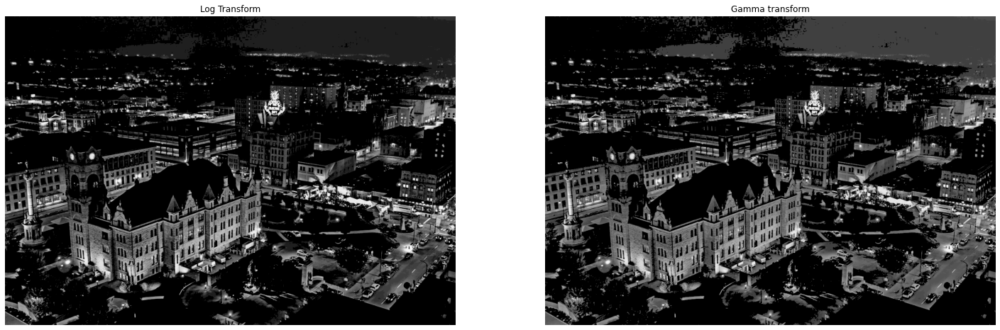

In [119]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(scraton_log,cmap = 'gray')
plt.title('Log Transform')
plt.axis('off')
plt.subplot(122)
plt.imshow(scraton_gamma1,cmap = 'gray')
plt.title('Gamma transform')
plt.axis('off')

The difference between the log and gamma transform image is mostly in the cloud region where the log transform keeps the sky region a little dark the gamma transform make it much brighter. Also the log image looks a little sharper compared to the gamma transform



# Question 6

In [106]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

### Question 6 Part (1)

In [144]:
samepicture = cv2.imread('Images/Same_picture.png',0)

In [117]:
def histequil(img):
    probabilities = np.zeros(256,dtype = int)
    h = img.shape[0]
    w = img.shape[1]
    res = np.zeros((h,w),dtype = int)
    for i in range(h):
        for j in range(w):
            probabilities[img[i][j]] += 1
    probabilities = probabilities/(w*h)
    mapping = np.zeros(256,dtype = int)
    cdf = 0
    for i in range(256):
        cdf += probabilities[i]
        mapping[i] = round(255*cdf)
    for i in range(h):
        for j in range(w):
            res[i][j] = int(mapping[img[i][j]])
    return res

In [147]:
eq_samepicture = histequil(samepicture)

Text(0.5, 1.0, 'Equalized Image')

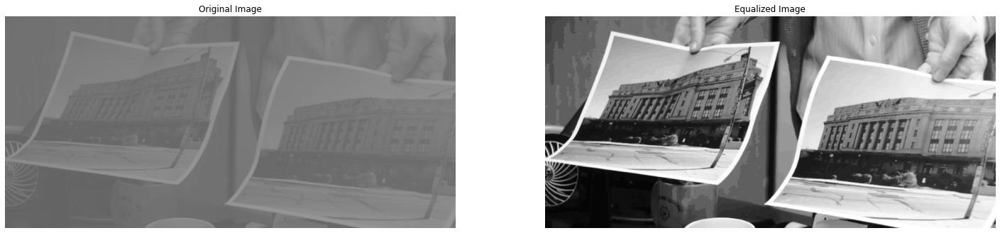

In [148]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(samepicture,vmin = 0,vmax = 255,cmap = 'gray')
plt.axis('off')
plt.title('Original Image')
plt.subplot(122)
plt.imshow(eq_samepicture,vmin = 0,vmax = 255,cmap = 'gray')
plt.axis('off')
plt.title('Equalized Image')

### Question 6 Part 2 (a)

In [126]:
def histogramMatch(image,reference):
    eq_image = histequil(image)
    eq_image = eq_image/255
    
    ref_histogram = np.histogram(reference,bins = 256)
    ref_histogram = ref_histogram[0]
    ref_prob = (ref_histogram)/(np.size(reference))
    
    reference_cdf = np.cumsum(ref_prob)
    
    res = np.searchsorted(reference_cdf,eq_image)
    
    return res

In [136]:
input_image = cv2.imread('Images/Creed.png',0)
reference_image = cv2.imread('Images/Texture.jpg',0)
reference_image2 = cv2.imread('Images/reference2.jpg',0)
reference_image3 = cv2.imread('Images/reference3.jpeg',0)

In [137]:
histmatched_ref1 = histogramMatch(input_image,reference_image)
histmatched_ref2 = histogramMatch(input_image,reference_image2)
histmatched_ref3 = histogramMatch(input_image,reference_image3)

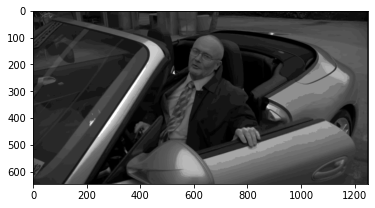

In [138]:
plt.imshow(histmatched_ref1,cmap = 'gray')

### Question 6 Part 2 (b)

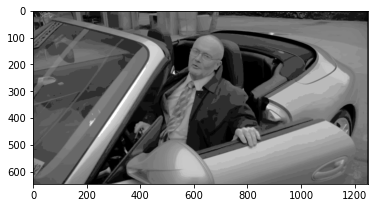

In [139]:
plt.imshow(histmatched_ref2,cmap = 'gray')

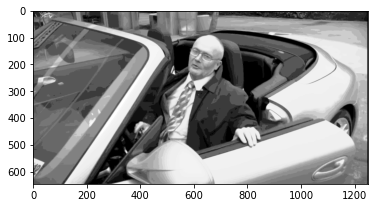

In [140]:
plt.imshow(histmatched_ref3,cmap = 'gray')

# Question 7

## Question 7.1.1 Part (1)

In [149]:
def meanFilter(img,k):
    h = img.shape[0]
    w = img.shape[1]
    res = np.zeros([h,w],dtype = int)
    m = int(k/2)
    for i in range(m,h-m):
        for j in range(m,w-m):
            sum = 0
            for a in range(i-m,i+m+1):
                for b in range(j-m,j+m+1):
                    sum += img[a][b]
            res[i][j] = int(sum/(k*k))
    return res

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [228]:
testpattern = cv2.imread('Images/testPattern.jpg',0)

In [152]:
import time
start = time.time()
testpattern_mean = meanFilter(testpattern,5)
end = time.time()
print(end - start)

2.7279105186462402


Text(0.5, 1.0, 'Mean of size 5')

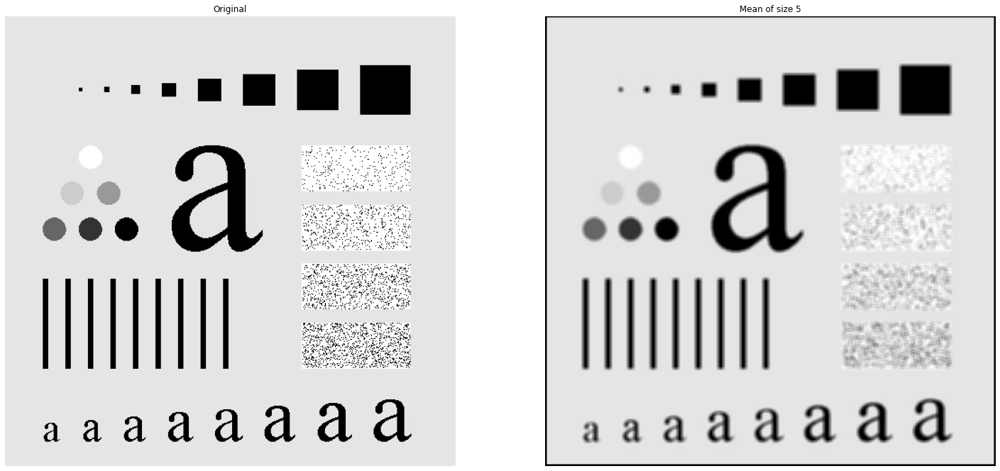

In [153]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(testpattern,cmap = 'gray')
plt.axis('off')
plt.title('Original')
plt.subplot(122)
plt.imshow(testpattern_mean,cmap = 'gray')
plt.axis('off')
plt.title('Mean of size 5')

## Question 7.1.1 Part (2)

In [54]:
def effMeanFilter(img,k):
    h = img.shape[0]
    w = img.shape[1]
    res = np.zeros([h,w],dtype = int)
    m = int(k/2)
    for i in range(m,h-m):
        sum=0
        for a in range(i-m,i+m+1):
            for b in range(0,k):
                sum += img[a][b]
                    
        res[i][m] = int(sum/(k*k))
                    
        for j in range(m+1,w-m):
            for a in range(i-m,i+m+1):
                sum -= img[a][j-m-1]

            for a in range(i-m,i+m+1):
                sum += img[a][j+m]
            
            res[i][j] = int(sum/(k*k))
    return res

In [156]:
import time
start = time.time()
testpattern_effmean = effMeanFilter(testpattern,5)
end = time.time()
print(end - start)

1.0454003810882568


Text(0.5, 1.0, 'Mean of size 5')

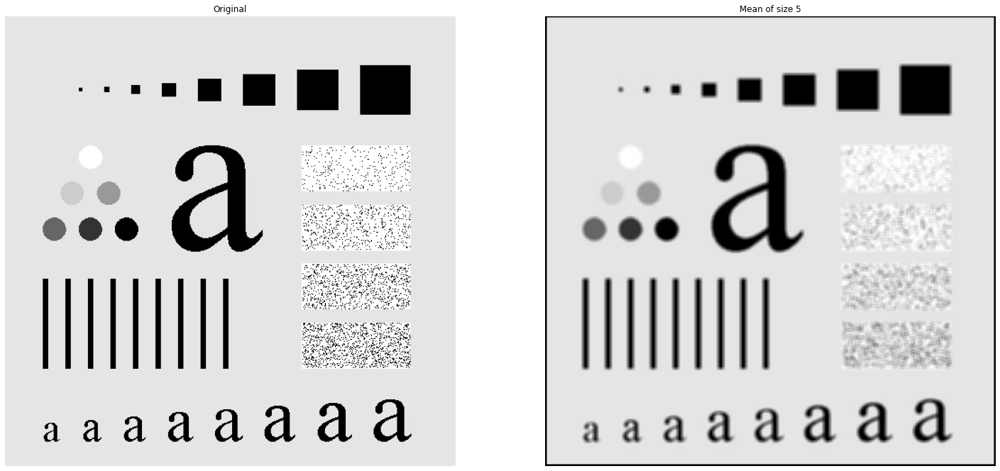

In [157]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(testpattern,cmap = 'gray')
plt.axis('off')
plt.title('Original')
plt.subplot(122)
plt.imshow(testpattern_effmean,cmap = 'gray')
plt.axis('off')
plt.title('Mean of size 5')

In [158]:
np.array_equal(testpattern_mean,testpattern_effmean)

True

## Question 7.1.1 Part(3)

In [19]:
img64 = cv2.imread('Images/64.jpg',0)
img128 = cv2.imread('Images/128.jpg',0)
img256 = cv2.imread('Images/256.png',0)
img1024 = cv2.imread('Images/1024.jpg',0)

In [20]:
array_nrm = np.zeros((4,4))
array_eff = np.zeros((4,4))

In [21]:
i = 0
for k in range(3,11,2):
    # For 64 bit image Normal
    start = time.time()
    meanFilter(img64,k)
    end = time.time()
    array_nrm[i][0] = end - start
    
    # For 64 bit efficient
    start = time.time()
    effMeanFilter(img64,k)
    end = time.time()
    array_eff[i][0] = end - start
    
    # For 128 bit image Normal
    start = time.time()
    meanFilter(img128,k)
    end = time.time()
    array_nrm[i][1] = end - start
    
    # For 128 bit efficient
    start = time.time()
    effMeanFilter(img128,k)
    end = time.time()
    array_eff[i][1] = end - start
    
    # For 256 bit image Normal
    start = time.time()
    meanFilter(img256,k)
    end = time.time()
    array_nrm[i][2] = end - start
    
    # For 256 bit efficient
    start = time.time()
    effMeanFilter(img256,k)
    end = time.time()
    array_eff[i][2] = end - start
    
    # For 1024 bit image Normal
    start = time.time()
    meanFilter(img1024,k)
    end = time.time()
    array_nrm[i][3] = end - start
    
    # For 1024 bit efficient
    start = time.time()
    effMeanFilter(img1024,k)
    end = time.time()
    array_eff[i][3] = end - start
    i += 1

In [23]:
x = [3,5,7,9]

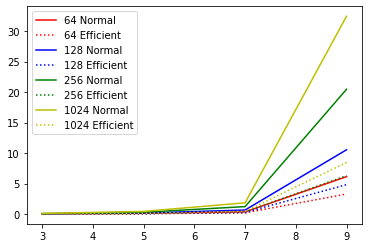

In [24]:
plt.plot(x,array_nrm[0,:],'r')
plt.plot(x,array_eff[0,:],'r:')

plt.plot(x,array_nrm[1,:],'b')
plt.plot(x,array_eff[1,:],'b:')

plt.plot(x,array_nrm[2,:],'g')
plt.plot(x,array_eff[2,:],'g:')

plt.plot(x,array_nrm[3,:],'y')
plt.plot(x,array_eff[3,:],'y:')

plt.legend(["64 Normal","64 Efficient","128 Normal","128 Efficient","256 Normal","256 Efficient","1024 Normal","1024 Efficient"])

## Question 7.1.1 Part (4)

In [192]:
testpattern_mean5 = effMeanFilter(testpattern,5)
testpattern_mean9 = effMeanFilter(testpattern,9)
testpattern_mean15 = effMeanFilter(testpattern,15)
testpattern_mean35 = effMeanFilter(testpattern,35)

Text(0.5, 1.0, 'K = 35')

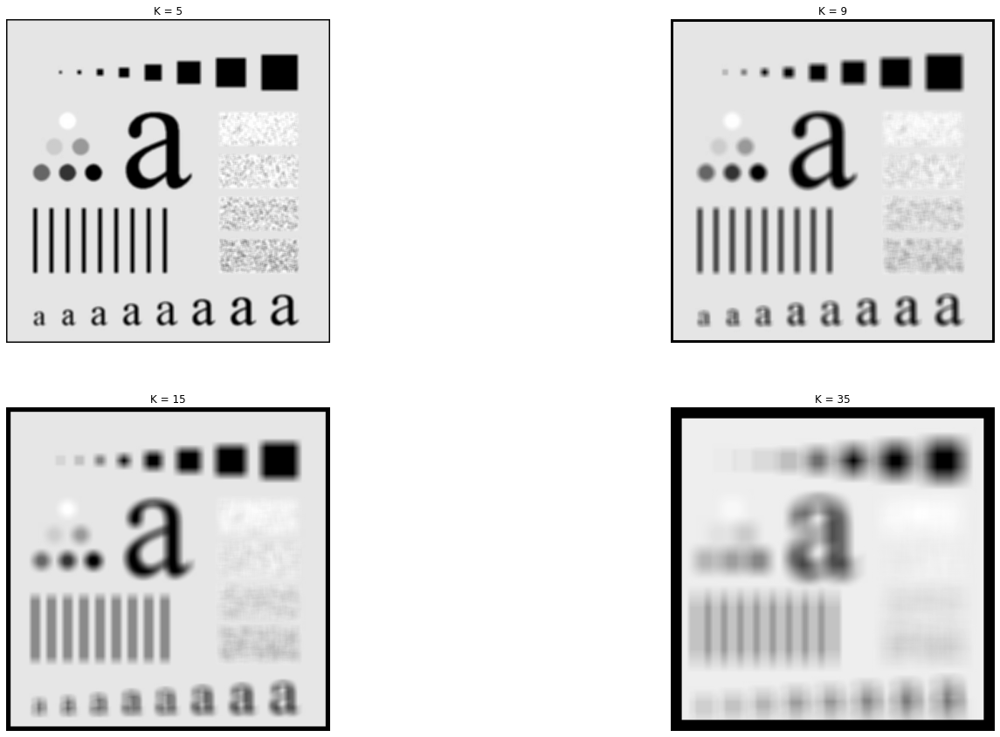

In [193]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(221)
plt.imshow(testpattern_mean5,cmap = 'gray')
plt.axis('off')
plt.title('K = 5')

plt.subplot(222)
plt.imshow(testpattern_mean9,cmap = 'gray')
plt.axis('off')
plt.title('K = 9')

plt.subplot(223)
plt.imshow(testpattern_mean15,cmap = 'gray')
plt.axis('off')
plt.title('K = 15')

plt.subplot(224)
plt.imshow(testpattern_mean35,cmap = 'gray')
plt.axis('off')
plt.title('K = 35')

In [206]:
hist1,bins1 = np.histogram(testpattern_mean5,bins = 256)
hist2,bins2 = np.histogram(testpattern_mean9,bins = 256)
hist3,bins3 = np.histogram(testpattern_mean15,bins = 256)
hist4,bins4 = np.histogram(testpattern_mean35,bins = 256)

Text(0.5, 1.0, 'K = 35')

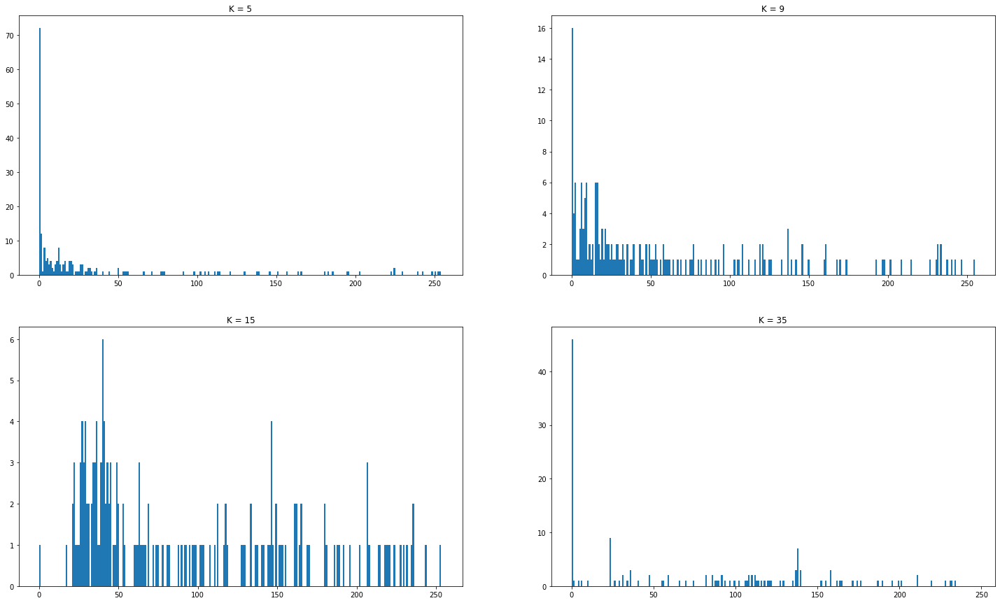

In [208]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)


plt.subplot(221)
plt.hist(hist1,bins1)
plt.axis('on')
plt.title('K = 5')

plt.subplot(222)
plt.hist(hist2,bins2)
plt.axis('on')
plt.title('K = 9')

plt.subplot(223)
plt.hist(hist3,bins3)
plt.axis('on')
plt.title('K = 15')

plt.subplot(224)
plt.hist(hist4,bins4)
plt.axis('on')
plt.title('K = 35')

## Question 7.1.2 Gaussian Filter 

### Question 7.1.2 Part 1 (a)

In [192]:
def approx1DGaussFilter1(k):
    temp = [1]
    prev = 1
    k = k-1
    for i in range(1,k+1):
        curr = (prev*(k - i + 1))/i
        temp.append(curr)
        prev = curr
    kernel = np.array(temp)
    maximum = np.max(kernel)
    var = 1/(maximum*np.sqrt(2*np.pi))
    return kernel,var

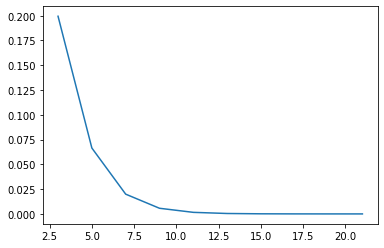

In [197]:
x = []
y = []
for i in range(3,23,2):
    x.append(i)
    var = approx1DGaussFilter1(i)[1]
    y.append(var)
plt.plot(x,y)

### Question 7.1.2 Part 1 (b) 

In [199]:
def approx1DGaussFilter2(sigma):
    k1 = round(3*sigma)
    k2 = round(5*sigma)
    k3 = round(7*sigma)
    
    if k1%2 == 0:
        k1 += 1
    if k2%2 == 0:
        k2 += 1
    if k3%2 == 0:
        k3 += 1
    
    res1 = approx1DGaussFilter1(k1)[0]
    res2 = approx1DGaussFilter1(k2)[0]
    res3 = approx1DGaussFilter1(k3)[0]
    
    return res1,k1,res2,k2,res3,k3
    # The output format is it returns the first kernel then its size then second then its size and so on....

### Question 7.1.2 Part 2 (a) 

In [185]:
def gaussKernelGenerator(k,var):
    temp = []
    m = int(k/2)
    for i in range(k):
        temp.append(i - m)
    arr = np.array(temp)
    res = np.zeros([k,k],dtype = float)
    for i in range(k):
        for j in range(k):
            temp1 = arr[i]*arr[i]
            temp2 = arr[j]*arr[j]
            val = (temp1+temp2)/(2*var)
            val = val*(-1)
            res[i][j] = (np.power(2.718,val))
    res = res/(var*2*np.pi)
    return res

### Question 7.1.2 Part 2 (b)

In [221]:
def approx2DGaussFilter(sd):
    kernel1d = approx1DGaussFilter2(sd)[2] # Since the 3rd position contains the 5sigma kernel
    k = kernel1d.shape[0]
    res = np.zeros((k,k))
    for i in range(k):
        for j in range(k):
            res[i][j] = kernel1d[i]*kernel1d[j]
    res = res/np.sum(res)
    return res

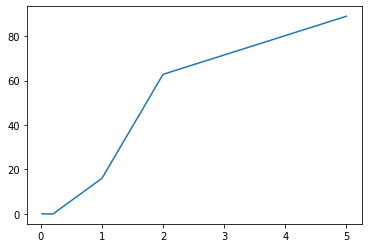

In [226]:
x = [0.02,0.2,1,2,5]
y = []
for a in range(5):
    gauss_ker = approx2DGaussFilter(x[a])
    count = 0
    for i in range(gauss_ker.shape[0]):
        for j in range(gauss_ker.shape[1]):
            if gauss_ker[i][j] < 1/255.0 :
                count += 1
    y.append(count*100/(gauss_ker.shape[0]**2))
plt.plot(x,y)

### Question 7.1.2 Part 2 (c)

In [227]:
def gaussianFilter(im,var,k):
    kernel = gaussKernelGenerator(k,var)
    kernel = kernel/np.sum(kernel)
    m = int(k/2)
    h = im.shape[0]
    w = im.shape[1]
    res = np.zeros((h,w),dtype = int)
    for i in range(m,h-m):
        for j in range(m,w-m):
            res[i][j] = np.sum(im[i-m:i+m+1,j-m:j+m+1] * kernel)
    return res

In [234]:
var1 = 0.2
var2 = 1
var3 = 5

In [238]:
gauss_var1_k5 = gaussianFilter(testpattern,var1,5)
gauss_var1_k9 = gaussianFilter(testpattern,var1,9)
gauss_var1_k15 = gaussianFilter(testpattern,var1,15)
gauss_var1_k35 = gaussianFilter(testpattern,var1,35)

In [239]:
gauss_var2_k5 = gaussianFilter(testpattern,var2,5)
gauss_var2_k9 = gaussianFilter(testpattern,var2,9)
gauss_var2_k15 = gaussianFilter(testpattern,var2,15)
gauss_var2_k35 = gaussianFilter(testpattern,var2,35)

In [240]:
gauss_var3_k5 = gaussianFilter(testpattern,var3,5)
gauss_var3_k9 = gaussianFilter(testpattern,var3,9)
gauss_var3_k15 = gaussianFilter(testpattern,var3,15)
gauss_var3_k35 = gaussianFilter(testpattern,var3,35)

Text(0.5, 1.0, 'K = 35 Var = 0.2')

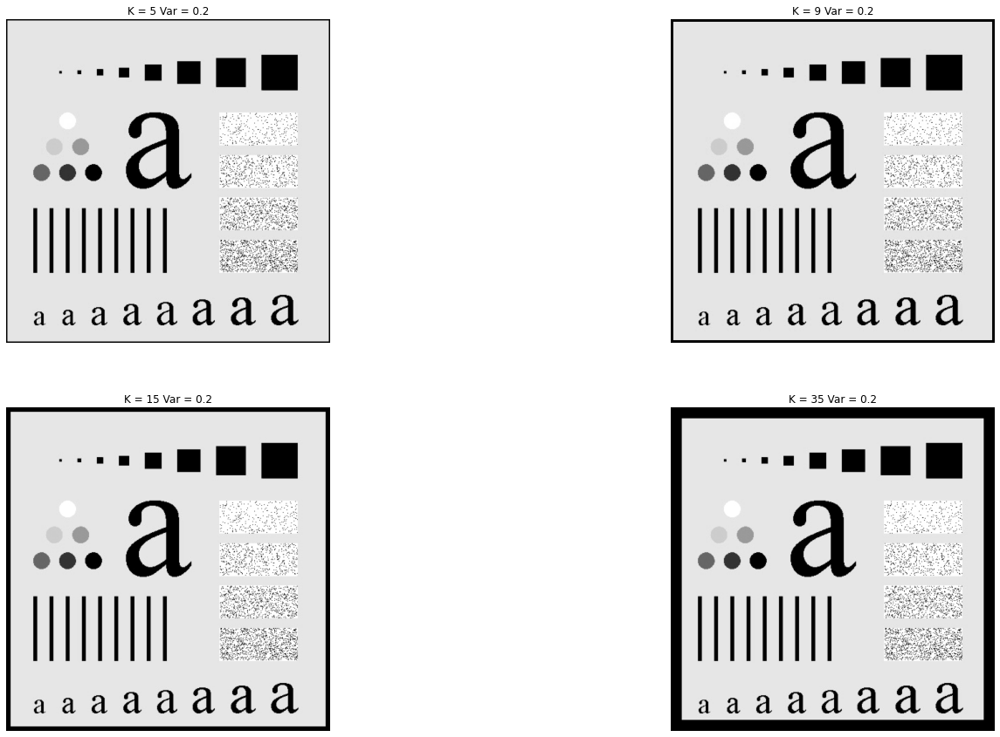

In [241]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(221)
plt.imshow(gauss_var1_k5,cmap = 'gray')
plt.axis('off')
plt.title('K = 5 Var = 0.2')

plt.subplot(222)
plt.imshow(gauss_var1_k9,cmap = 'gray')
plt.axis('off')
plt.title('K = 9 Var = 0.2')

plt.subplot(223)
plt.imshow(gauss_var1_k15,cmap = 'gray')
plt.axis('off')
plt.title('K = 15 Var = 0.2')

plt.subplot(224)
plt.imshow(gauss_var1_k35,cmap = 'gray')
plt.axis('off')
plt.title('K = 35 Var = 0.2')

Text(0.5, 1.0, 'K = 35 Var = 1')

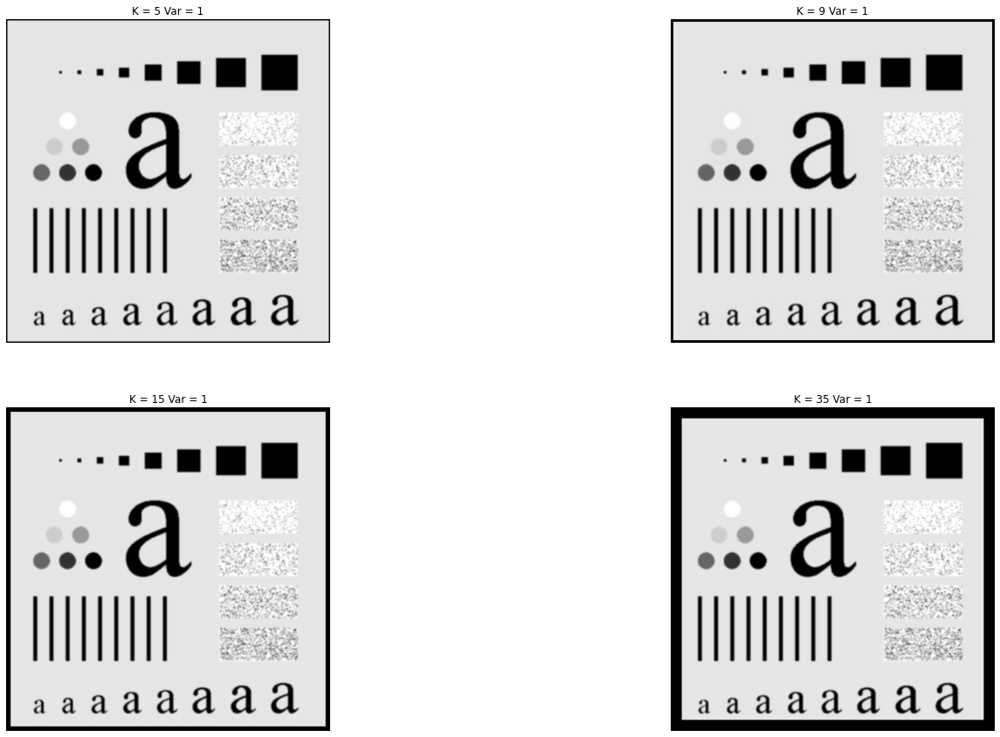

In [242]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(221)
plt.imshow(gauss_var2_k5,cmap = 'gray')
plt.axis('off')
plt.title('K = 5 Var = 1')

plt.subplot(222)
plt.imshow(gauss_var2_k9,cmap = 'gray')
plt.axis('off')
plt.title('K = 9 Var = 1')

plt.subplot(223)
plt.imshow(gauss_var2_k15,cmap = 'gray')
plt.axis('off')
plt.title('K = 15 Var = 1')

plt.subplot(224)
plt.imshow(gauss_var2_k35,cmap = 'gray')
plt.axis('off')
plt.title('K = 35 Var = 1')

Text(0.5, 1.0, 'K = 35 Var = 5')

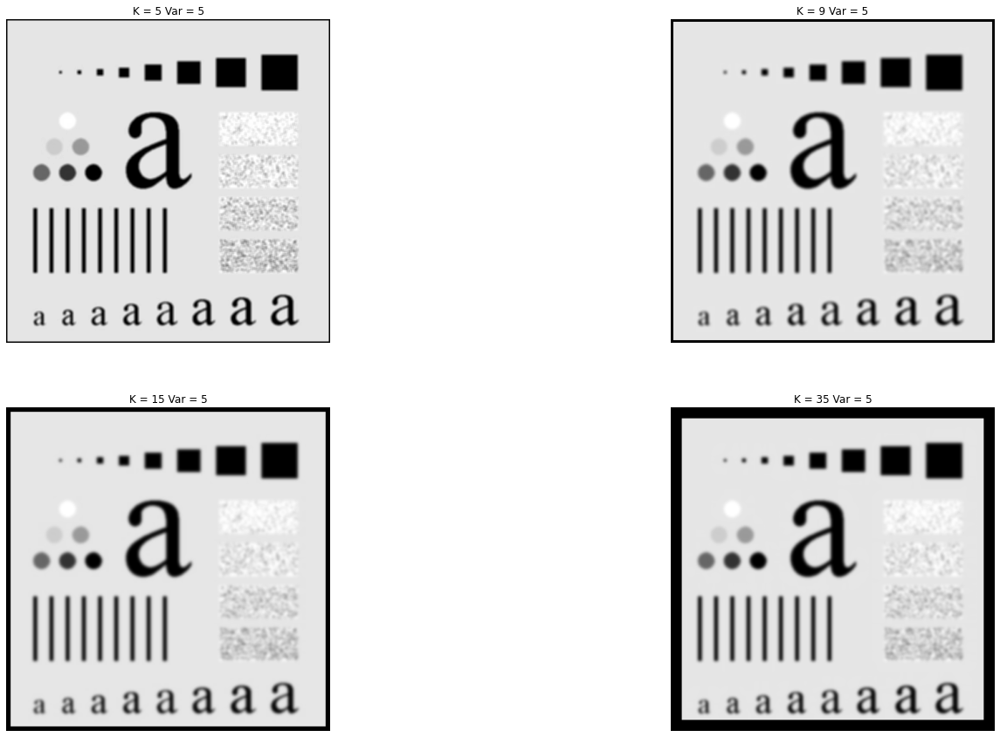

In [243]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(221)
plt.imshow(gauss_var3_k5,cmap = 'gray')
plt.axis('off')
plt.title('K = 5 Var = 5')

plt.subplot(222)
plt.imshow(gauss_var3_k9,cmap = 'gray')
plt.axis('off')
plt.title('K = 9 Var = 5')

plt.subplot(223)
plt.imshow(gauss_var3_k15,cmap = 'gray')
plt.axis('off')
plt.title('K = 15 Var = 5')

plt.subplot(224)
plt.imshow(gauss_var3_k35,cmap = 'gray')
plt.axis('off')
plt.title('K = 35 Var = 5')

Observation \
As we can see from above that as the value of k and sigma increase the blurring or smoothing effect increases \
Comparing with the output of 7.1.1.4 we can see that the blurring is higher in 7.1.1.4 than in gaussian

## Question 7.2 Non Linear Filters

In [177]:
def pepperfilter(img,k):
    h = img.shape[0]
    w = img.shape[1]
    res = np.zeros([h,w],dtype = int)
    m = int(k/2)
    for i in range(m,h-m):
        q = []
        for b in range(0,k):
            for a in range(i-m,i+m+1):
                q.append(img[a][b])
        res[i][m] = max(q)
        for j in range(m+1,w-m):
            for a in range(k):
                q.pop(0)
            for a in range(i-m,i+m+1):
                q.append(img[a][j+m])
            res[i][j] = max(q)
    return res

In [58]:
def saltfilter(img,k):
    h = img.shape[0]
    w = img.shape[1]
    res = np.zeros([h,w],dtype = int)
    m = int(k/2)
    for i in range(m,h-m):
        q = []
        for b in range(0,k):
            for a in range(i-m,i+m+1):
                q.append(img[a][b])
        res[i][m] = min(q)
        for j in range(m+1,w-m):
            for a in range(k):
                q.pop(0)
            for a in range(i-m,i+m+1):
                q.append(img[a][j+m])
            res[i][j] = min(q)
    return res

In [179]:
def medianfilter(img,k):
    h = img.shape[0]
    w = img.shape[1]
    ans = np.zeros([h,w],dtype = int)
    m = int(k/2)
    for i in range(m,h-m):
        for j in range(m,w-m):
            temp = []
            for a in range(i-m,i+m+1):
                for b in range(j-m,j+m+1):
                    temp.append(img[a][b])
            x = np.median(temp)
            ans[i][j] = x
    return ans

In [180]:
noisy1 = cv2.imread('Images/noisy1.jpeg',0)
noisy2 = cv2.imread('Images/noisy2.jpeg',0)
noisy3 = cv2.imread('Images/noisy3.jpeg',0)

In [181]:
noisy1_pepper = pepperfilter(noisy1,3)
noisy2_salt = saltfilter(noisy2,3)

In [182]:
import time
start = time.time()
noisy3_median = medianfilter(noisy3,3)
end = time.time()
print(end - start)

2.307403802871704


Text(0.5, 1.0, 'Median Filter')

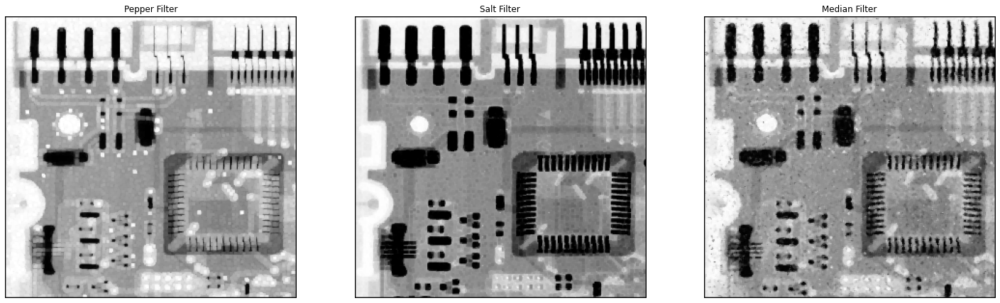

In [185]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(131)
plt.imshow(noisy1_pepper,cmap = 'gray')
plt.axis('off')
plt.title('Pepper Filter')
plt.subplot(132)
plt.imshow(noisy2_salt,cmap = 'gray')
plt.axis('off')
plt.title('Salt Filter')
plt.subplot(133)
plt.imshow(noisy3_median,cmap = 'gray')
plt.axis('off')
plt.title('Median Filter')

### Question 7.2 Part (2)

In [186]:
def effMedianFilter(img,k):
    h = img.shape[0]
    w = img.shape[1]
    res = np.zeros([h,w],dtype = int)
    m = int(k/2)
    for i in range(m,h-m):
        q = []
        for b in range(0,k):
            for a in range(i-m,i+m+1):
                q.append(img[a][b])
        res[i][m] = np.median(q)
        for j in range(m+1,w-m):
            for a in range(k):
                q.pop(0)
            for a in range(i-m,i+m+1):
                q.append(img[a][j+m])
            res[i][j] = np.median(q)
    return res

In [187]:
import time
start = time.time()
noisy3_effmedian = effMedianFilter(noisy3,3)
end = time.time()
print(end - start)

2.168637752532959


In [189]:
np.array_equal(noisy3_effmedian,noisy3_median)

True

(-0.5, 301.5, 291.5, -0.5)

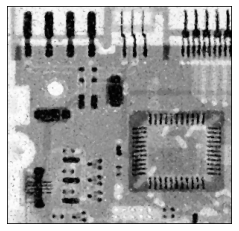

In [191]:
plt.imshow(noisy3_effmedian,cmap = 'gray')
plt.axis('off')

## Question 7.3

In [12]:
def roberts(img):
    h = img.shape[0]
    w = img.shape[1]
    mx = np.zeros((h,w),dtype = int)
    my = np.zeros((h,w),dtype = int)
    res = np.zeros((h,w),dtype = int)
    direction = np.ones((h,w),dtype = int)
    for i in range(h-1):
        for j in range(w-1):
            mx[i][j] = int(img[i][j+1]) - int(img[i+1][j])
            my[i][j] = int(img[i][j]) - int(img[i+1][j+1])
            res[i][j] = int(np.sqrt(np.square(mx[i][j]) + np.square(my[i][j])))
            if mx[i][j] != 0:
                direction[i][j] = (np.arctan2(my[i][j],mx[i][j])).astype(int)
    maximum = np.amax(res)
    res = (res*255)/maximum
    for i in range(h):
        for j in range(w):
            res[i][j] = int(res[i][j])
    return res,direction

In [13]:
office = cv2.imread('Images/office.jpg',0)

In [16]:
[robert_edge,robert_direction] = roberts(office)

Text(0.5, 1.0, 'Direction')

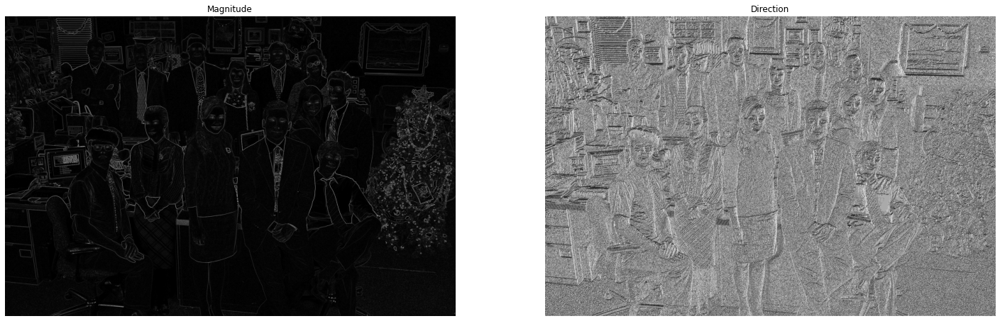

In [17]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(robert_edge,cmap = 'gray')
plt.axis('off')
plt.title('Magnitude')

plt.subplot(122)
plt.imshow(robert_direction,cmap = 'gray')
plt.axis('off')
plt.title('Direction')

In [8]:
def prewitt(img):
    h = img.shape[0]
    w = img.shape[1]
    mx = np.zeros((h,w),dtype = int)
    my = np.zeros((h,w),dtype = int)
    direction = np.zeros((h,w),dtype = int)
    res = np.zeros((h,w),dtype = int)
    for i in range(1,h-1):
        for j in range(1,w-1):
            mx[i][j] = int(img[i-1][j+1]) + int(img[i][j+1]) + int(img[i+1][j+1])-int(img[i-1][j-1]) - int(img[i][j-1]) - int(img[i+1][j-1])
            my[i][j] = int(img[i-1][j-1]) + int(img[i-1][j]) + int(img[i-1][j+1])-int(img[i+1][j-1]) - int(img[i+1][j]) - int(img[i+1][j+1])
            res[i][j] = int(np.sqrt(np.square(mx[i][j]) + np.square(my[i][j])))
            direction[i][j] = (np.arctan2(my[i][j],mx[i][j])).astype(int)
    maximum = np.amax(res)
    res = (res*255)/maximum
    for i in range(h):
        for j in range(w):
            res[i][j] = int(res[i][j])
    return res,direction

In [9]:
prewitt_edge,prewitt_direction = prewitt(office)

Text(0.5, 1.0, 'Direction')

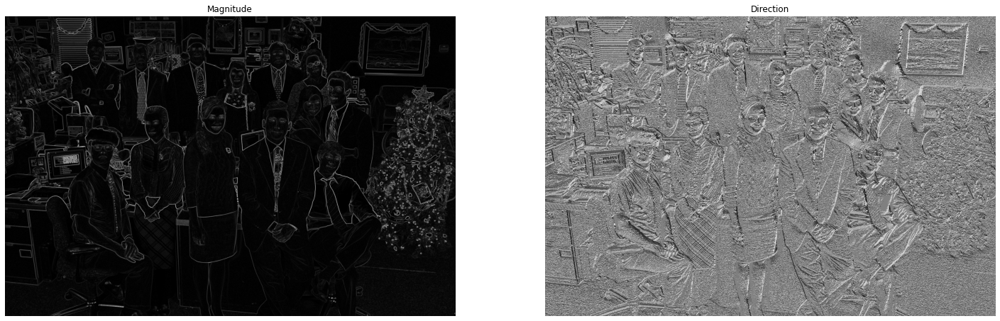

In [10]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(prewitt_edge,cmap = 'gray')
plt.axis('off')
plt.title('Magnitude')

plt.subplot(122)
plt.imshow(prewitt_direction,cmap = 'gray')
plt.axis('off')
plt.title('Direction')

In [18]:
def sobel(img):
    h = img.shape[0]
    w = img.shape[1]
    mx = np.zeros((h,w),dtype = int)
    my = np.zeros((h,w),dtype = int)
    res = np.zeros((h,w),dtype = int)
    direction = np.zeros((h,w),dtype = int)
    for i in range(1,h-1):
        for j in range(1,w-1):
            mx[i][j] = int(img[i-1][j+1]) + int(2*img[i][j+1]) + int(img[i+1][j+1])-int(img[i-1][j-1]) - int(2*img[i][j-1]) - int(img[i+1][j-1])
            my[i][j] = int(img[i-1][j-1]) + int(2*img[i-1][j]) + int(img[i-1][j+1])-int(img[i+1][j-1]) - int(2*img[i+1][j]) - int(img[i+1][j+1])
            res[i][j] = int(np.sqrt(np.square(mx[i][j]) + np.square(my[i][j])))
            direction[i][j] = (np.arctan2(my[i][j],mx[i][j])).astype(int)
    maximum = np.amax(res)
    res = (res*255)/maximum
    for i in range(h):
        for j in range(w):
            res[i][j] = int(res[i][j])
    return res,direction

In [19]:
sobel_edge,sobel_direction = sobel(office)

Text(0.5, 1.0, 'Direction')

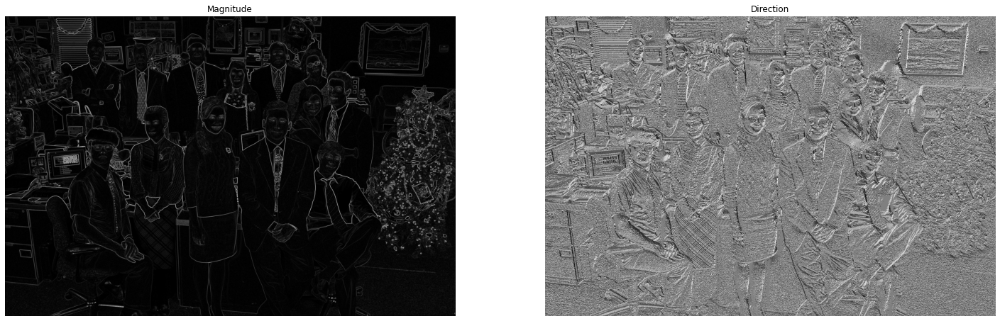

In [20]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(sobel_edge,cmap = 'gray')
plt.axis('off')
plt.title('Magnitude')

plt.subplot(122)
plt.imshow(sobel_direction,cmap = 'gray')
plt.axis('off')
plt.title('Direction')

In [35]:
def laplacian1(img):
    h = img.shape[0]
    w = img.shape[1]
    mx = np.zeros((h,w),dtype = int)
    my = np.zeros((h,w),dtype = int)
    res = np.zeros((h,w),dtype = int)
    direction = np.zeros((h,w),dtype = int)
    for i in range(1,h-1):
        for j in range(1,w-1):
            mx[i][j] = int(img[i][j-1]) - int(2*img[i][j]) + int(img[i][j+1])
            my[i][j] = int(img[i-1][j]) - int(2*img[i][j]) + int(img[i+1][j])
            res[i][j] = int(np.sqrt(np.square(mx[i][j]) + np.square(my[i][j])))
            direction[i][j] = (np.arctan2(my[i][j],mx[i][j])).astype(int)
    for i in range(h):
        for j in range(w):
            res[i][j] = int(res[i][j])
    return res,direction

In [41]:
def laplacian2(img):
    h = img.shape[0]
    w = img.shape[1]
    x_arr = np.array([[0.5,0,0.5],[1,-4,1],[0.5,0,0.5]])
    y_arr = np.array([[0.5,1,0.5],[0,-4,0],[0.5,1,0.5]])
    mx = np.zeros((h,w),dtype = float)
    my = np.zeros((h,w),dtype = float)
    res = np.zeros((h,w),dtype = int)
    direction = np.zeros((h,w),dtype = int)
    for i in range(1,h-1):
        for j in range(1,w-1):
            temp = img[i-1:i+2,j-1:j+2]
            mx[i][j] = np.sum(temp*x_arr)
            my[i][j] = np.sum(temp*y_arr)
            res[i][j] = int(np.sqrt(np.square(mx[i][j]) + np.square(my[i][j])))
            direction[i][j] = (np.arctan2(my[i][j],mx[i][j])).astype(int)
    for i in range(h):
        for j in range(w):
            res[i][j] = int(res[i][j])
    return res,direction

In [ ]:
laplace1_edge,laplace1_direction = laplacian1(office)

In [42]:
laplace2_edge,laplace2_direction = laplacian2(office)

Text(0.5, 1.0, 'Direction')

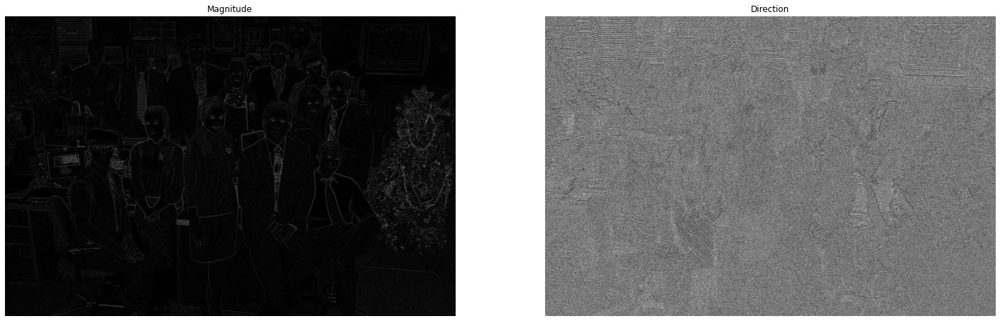

In [34]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(laplace1_edge,cmap = 'gray')
plt.axis('off')
plt.title('Magnitude')

plt.subplot(122)
plt.imshow(laplace1_direction,cmap = 'gray')
plt.axis('off')
plt.title('Direction')

Text(0.5, 1.0, 'Direction')

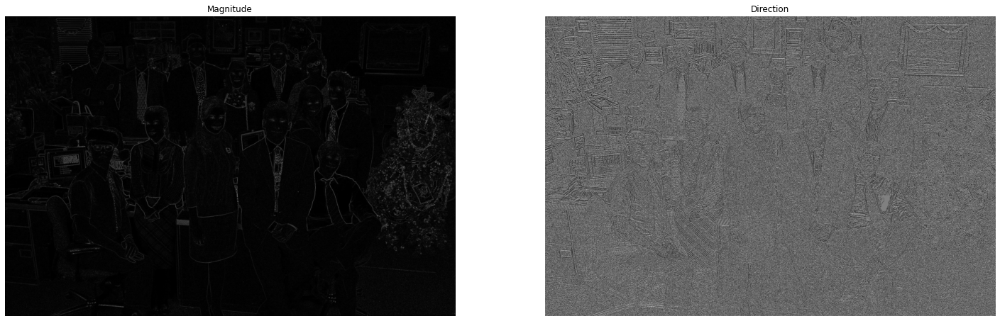

In [43]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(laplace2_edge,cmap = 'gray')
plt.axis('off')
plt.title('Magnitude')

plt.subplot(122)
plt.imshow(laplace2_direction,cmap = 'gray')
plt.axis('off')
plt.title('Direction')

### Question 7.3 Part (2)

In [48]:
def sobel5(img):
    h = img.shape[0]
    w = img.shape[1]
    y_arr = np.array([[2,2,4,2,2],[1,1,2,1,1],[0,0,0,0,0],[-1,-1,-2,-1,-1],[-2,-2,-4,-2,-2]])
    x_arr = np.array([[-2,-1,-0,1,2],[-2,-1,-0,1,2],[-4,-2,0,2,4],[-2,-1,-0,1,2],[-2,-1,-0,1,2]])
    mx = np.zeros((h,w),dtype = float)
    my = np.zeros((h,w),dtype = float)
    res = np.zeros((h,w),dtype = int)
    direction = np.zeros((h,w),dtype = int)
    for i in range(2,h-2):
        for j in range(2,w-2):
            temp = img[i-2:i+3,j-2:j+3]
            mx[i][j] = np.sum(temp*x_arr)
            my[i][j] = np.sum(temp*y_arr)
            res[i][j] = int(np.sqrt(np.square(mx[i][j]) + np.square(my[i][j])))
            direction[i][j] = (np.arctan2(my[i][j],mx[i][j])).astype(int)
    for i in range(h):
        for j in range(w):
            res[i][j] = int(res[i][j])
    return res,direction

In [49]:
sobel5_edge,sobel5_direction = sobel5(office)

Text(0.5, 1.0, 'Direction')

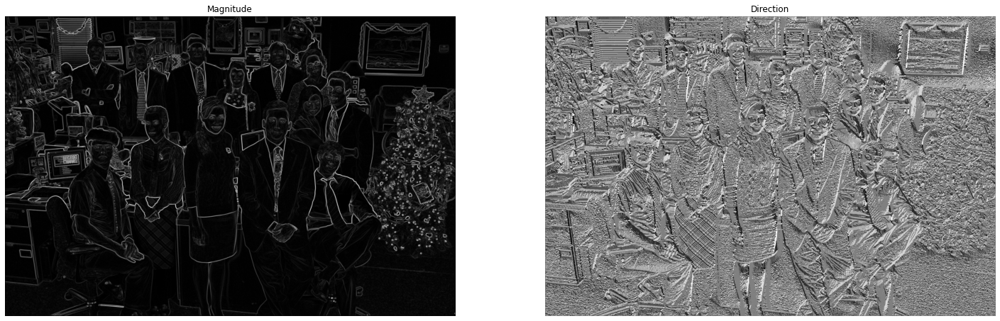

In [50]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(sobel5_edge,cmap = 'gray')
plt.axis('off')
plt.title('Magnitude')

plt.subplot(122)
plt.imshow(sobel5_direction,cmap = 'gray')
plt.axis('off')
plt.title('Direction')

In [51]:
def prewitt5(img):
    h = img.shape[0]
    w = img.shape[1]
    y_arr = np.array([[2,2,2,2,2],[1,1,1,1,1],[0,0,0,0,0],[-1,-1,-1,-1,-1],[-2,-2,-2,-2,-2]])
    x_arr = np.array([[-2,-1,-0,1,2],[-2,-1,-0,1,2],[-2,-1,-0,1,2],[-2,-1,-0,1,2],[-2,-1,-0,1,2]])
    mx = np.zeros((h,w),dtype = float)
    my = np.zeros((h,w),dtype = float)
    res = np.zeros((h,w),dtype = int)
    direction = np.zeros((h,w),dtype = int)
    for i in range(2,h-2):
        for j in range(2,w-2):
            temp = img[i-2:i+3,j-2:j+3]
            mx[i][j] = np.sum(temp*x_arr)
            my[i][j] = np.sum(temp*y_arr)
            res[i][j] = int(np.sqrt(np.square(mx[i][j]) + np.square(my[i][j])))
            direction[i][j] = (np.arctan2(my[i][j],mx[i][j])).astype(int)
    for i in range(h):
        for j in range(w):
            res[i][j] = int(res[i][j])
    return res,direction

In [52]:
prewitt5_edge,prewitt5_direction = prewitt5(office)

Text(0.5, 1.0, 'Direction')

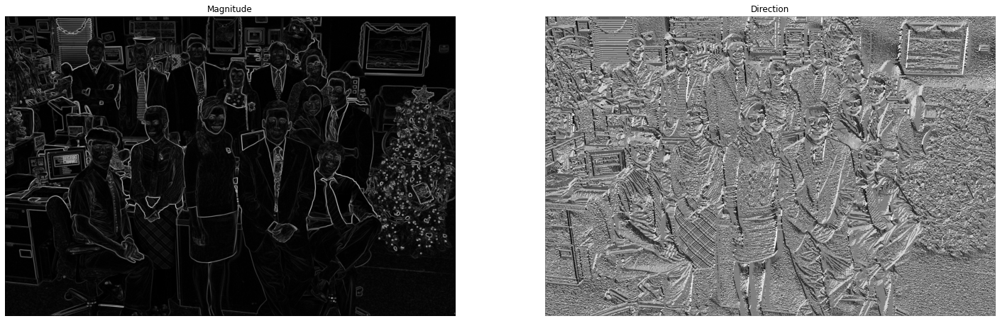

In [53]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.imshow(prewitt5_edge,cmap = 'gray')
plt.axis('off')
plt.title('Magnitude')

plt.subplot(122)
plt.imshow(prewitt5_direction,cmap = 'gray')
plt.axis('off')
plt.title('Direction')

# Question 8

In [56]:
galaxy = cv2.imread('Images/galaxies.jpeg',0)
galaxy.shape

(2567, 2758)

In [59]:
temp1 = saltfilter(galaxy,15)

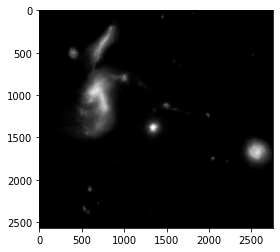

In [61]:
plt.imshow(temp1,cmap = 'gray')

In [62]:
A = np.array([0.0,0.4])
B = np.array([0.4,1.0])
K1 = np.array([0.0,0.0])
K2 = np.array([0.2,1.0])
temp2 = piecewiseLinTransform(K1,K2,A,B,temp1)

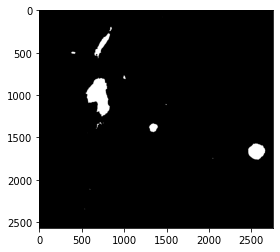

In [63]:
plt.imshow(temp2,cmap = 'gray')

In [68]:
final_q8 = saltfilter(temp2,13)

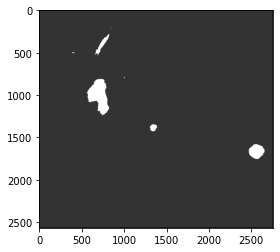

In [69]:
plt.imshow(final_q8,cmap = 'gray')

The steps involved were :
1) Firstly using a large kernel saltfilter to remove the small bright starts \
2) Then applying thresholding using linearpiecewise function \
3) Again applying saltfilter to remove the small white dots in the image